# ***HI EVERYONE WELCOME TO THIS PROJECT IN THIS PROJECT WE DETCT THE FAKE AND REAL VOICES USING DEEP LEARNING TECHNIQUE***

## ***CREATE THE DIRECTORY FOR KAGGLE DATASET***


In [ ]:
! mkdir -p ~/.kaggle
! cp kaggle.json ~/.kaggle/

# ***Extract The Data Directly from kaggle API For Fake Voices And Real Voices***

In [ ]:
! kaggle datasets download -d birdy654/deep-voice-deepfake-voice-recognition

100% 3.67G/3.69G [00:36<00:00, 138MB/s]
100% 3.69G/3.69G [00:36<00:00, 110MB/s]


# ***Extract The Data From Zip File***

In [ ]:
import zipfile
zip_ref = zipfile.ZipFile("/content/deep-voice-deepfake-voice-recognition.zip")
zip_ref.extractall("/content")
zip_ref.close()

# ***LOAD Dataset  CSV FILE FROM PANDAS LIBRARY***

In [ ]:
df = pd.read_csv("/content/KAGGLE/DATASET-balanced.csv")

# ***SOME BASIC PYTHON LIBRARY***

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ***DATASET LOOK LIKE***

In [ ]:
df.head(40)

,chroma_stft,rms,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,LABEL
0,0.338055,0.027948,2842.948867,4322.916759,6570.586186,0.041050,-462.169586,90.311272,19.073769,24.046888,...,-6.686564,0.902086,-7.251551,-1.198342,4.747403,-4.986279,0.953935,-5.013138,-6.779060,FAKE
1,0.443766,0.037838,2336.129597,3445.777044,3764.949874,0.047730,-409.413422,120.348808,-7.161531,5.114784,...,-2.131157,-6.876417,-1.359395,0.326401,-5.420016,-2.109968,-1.757634,-9.537907,-8.494421,FAKE
2,0.302528,0.056578,2692.988386,2861.133180,4716.610271,0.080342,-318.996033,120.490273,-24.625771,23.891073,...,-5.853725,-3.724773,-6.627182,-5.117002,-6.072106,-0.994653,-1.617120,-3.922354,-7.033001,FAKE
3,0.319933,0.031504,2241.665382,3503.766175,3798.641521,0.047180,-404.636749,136.320908,2.308172,-3.907071,...,-1.898315,-2.046493,-7.176277,-3.293508,4.209121,0.121835,-5.407063,-3.654926,-3.274857,FAKE
4,0.420055,0.016158,2526.069123,3102.659519,5025.077899,0.051905,-410.497925,152.731400,-18.266771,51.993462,...,-1.952340,0.810868,6.238493,6.555839,7.535542,2.849219,2.616843,-1.793357,-5.060998,FAKE
5,0.442880,0.012317,3952.880304,3702.717829,7104.089991,0.115387,-498.179657,97.245255,-21.382017,45.624386,...,-6.466366,2.856888,-0.157036,-2.824058,0.383832,-1.089466,2.998828,-5.218136,-1.423959,FAKE
6,0.453897,0.021782,4178.072150,3698.644769,7508.242075,0.131647,-410.383087,97.026733,-22.508402,49.689598,...,-5.320498,-4.209944,-2.051953,-0.714617,-7.889741,-0.377954,-8.421499,-5.800948,-12.060839,FAKE
7,0.474154,0.011107,3993.039753,3948.154333,7872.563956,0.114879,-440.818970,103.029533,-21.213911,49.066498,...,2.810230,-2.150585,-1.529685,3.354003,-6.589828,5.678379,-2.742477,-5.159016,-10.969421,FAKE
8,0.602690,0.000970,3815.431438,3992.517515,6887.564689,0.121769,-539.965088,94.811630,-51.388660,33.196476,...,-1.619109,10.417936,-9.675606,-0.937404,0.909395,4.827445,5.055848,-3.618021,5.053717,FAKE
9,0.453962,0.017612,2894.560788,3435.434131,5663.232422,0.065904,-403.053009,138.079620,-20.038134,39.301231,...,0.496345,-0.003924,0.801856,3.294856,-5.852333,-1.849402,-7.108891,-0.818681,-7.824217,FAKE


# ***IMPORT SOME VOICES LIBRARY LIKE LIBROSA AND IPYTHON***

In [1]:
import librosa
import librosa.display as display
import os
import IPython.display as ipd

# ***FIND THE LIST OF AUDIO FILE***

In [ ]:
for file in os.listdir('/content/KAGGLE/AUDIO'):
  print(file)

REAL
FAKE


# ***EXTRACT THE FEATURE FROM THE FILE AUDIO REAL AND FAKE VOICES***

In [ ]:
paths = []

labels = []

for dirname,_, filename in os.walk('/content/KAGGLE/AUDIO'):

  for filename in filename:

    paths.append(os.path.join(dirname,filename))

    label = dirname.split('/')[-1]

    label=label.split('/')[0]

    labels.append(label.lower())

print('Dataset is Loaded')

Dataset is Loaded


# ***LABELS OF AUDIO FILE***

In [ ]:
labels[:5]

['real', 'real', 'real', 'real', 'real']

# ***CREATING THE NEW DATAFRAME WITH AUDIO AND LABEL***

In [ ]:
# Create a Dataframe

df = pd.DataFrame()
df['audio'] = paths
df['label'] = labels


df.head(50)

,audio,label
0,/content/KAGGLE/AUDIO/REAL/margot-original.wav,real
1,/content/KAGGLE/AUDIO/REAL/taylor-original.wav,real
2,/content/KAGGLE/AUDIO/REAL/trump-original.wav,real
3,/content/KAGGLE/AUDIO/REAL/musk-original.wav,real
4,/content/KAGGLE/AUDIO/REAL/ryan-original.wav,real
5,/content/KAGGLE/AUDIO/REAL/biden-original.wav,real
6,/content/KAGGLE/AUDIO/REAL/linus-original.wav,real
7,/content/KAGGLE/AUDIO/REAL/obama-original.wav,real
8,/content/KAGGLE/AUDIO/FAKE/musk-to-trump.wav,fake
9,/content/KAGGLE/AUDIO/FAKE/linus-to-musk.wav,fake


In [ ]:
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import os

# ***GENERATE THE WAVE PLOT AND SPECTROGRAME TO DISPLAY THE WAVE PATTERN OF REAL AND FAKE AUDIO***

In [ ]:
def waveplot(data,sr,label):
  plt.figure(figsize=(14,4))
  plt.title(label,size=20)
  librosa.display.waveshow(data,sr=sr)
  plt.show()

def spectrogram(data,sr,label):
  x = librosa.stft(data)
  xdb = librosa.amplitude_to_db(abs(x))
  plt.figure(figsize=(14,4))
  plt.title(label,size=20)
  librosa.display.specshow(xdb,sr=sr,x_axis='time',y_axis='hz')
  plt.colorbar()

# ***SPECTROGRAM IS BASICALLY SHOW THE LOUDNESS OF SOUND***

# ***PATH OF SOME AUDIO FILE TO TEST***

In [ ]:
path = "/content/KAGGLE/AUDIO/FAKE/biden-to-taylor.wav"

In [ ]:
plt.figure(figsize=(14,5))
ipd.Audio(path)


# ***FAKE VOICE AUDIO***

In [5]:
file_name = "/content/ha-ha-ha-89248.mp3"

In [6]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14,5))
ipd.Audio(file_name)

<Figure size 1400x500 with 0 Axes>

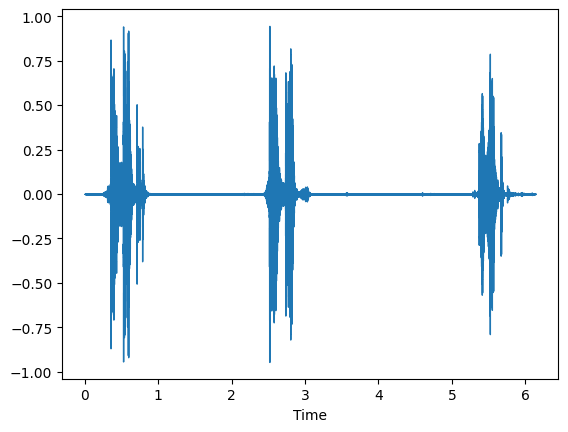

In [7]:
data,sample_rate = librosa.load(file_name)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(file_name)

# ***SAME REAL AND FAKE VOICES***

In [8]:
sample_rate

22050

In [10]:
file_name = "/content/Alg_1_1005.wav"

In [11]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14,5))
ipd.Audio(file_name)

<Figure size 1400x500 with 0 Axes>

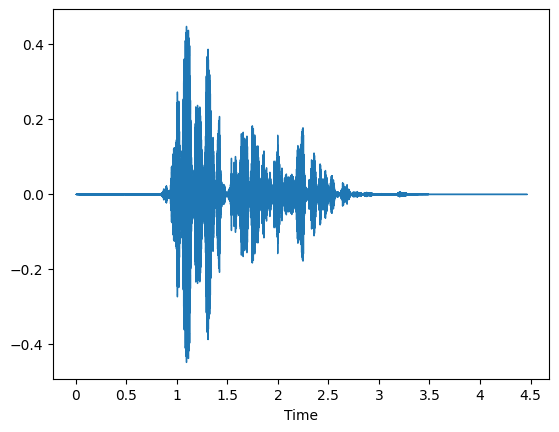

In [12]:
data,sample_rate = librosa.load(file_name)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(file_name)

In [14]:
from scipy.io import wavfile as wav
wave_sample_rate , wave_audio = wav.read(file_name)

In [17]:
wave_audio

array([0, 0, 0, ..., 0, 0, 0], dtype=int16)

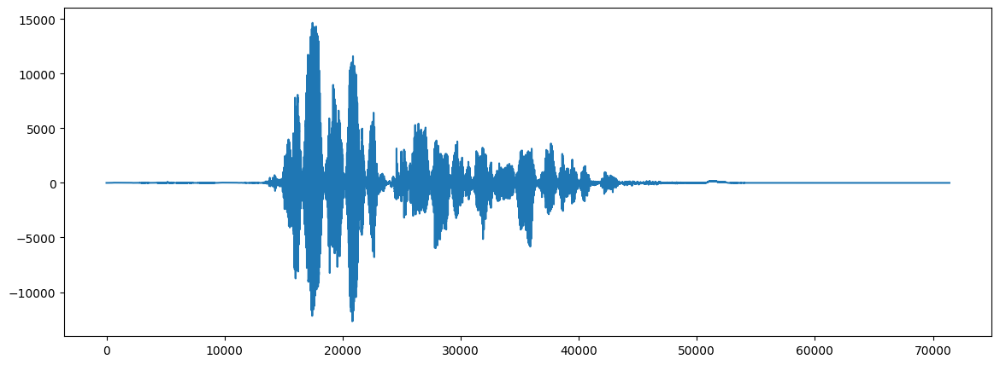

In [16]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14,5))
plt.plot(wave_audio)

In [18]:
audio_path = "/content/real_10032.wav"

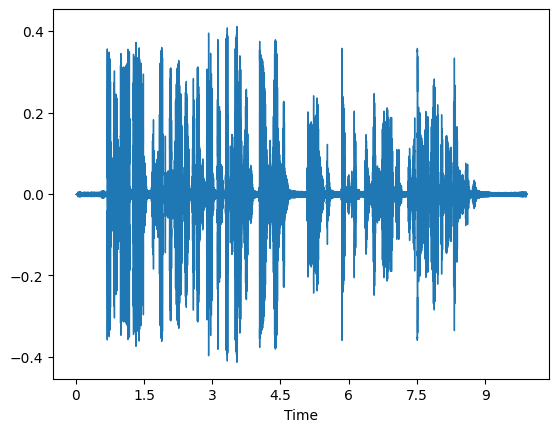

In [21]:
data,sample_rate = librosa.load(audio_path)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(audio_path)

# ***SCIPY FOR WAVE AUDIO GENRATOR***

In [22]:
from scipy.io import wavfile as wav
wave_sample_rate , wave_audio = wav.read(audio_path)

In [23]:
wave_audio

array([0, 0, 0, ..., 0, 0, 0], dtype=int16)

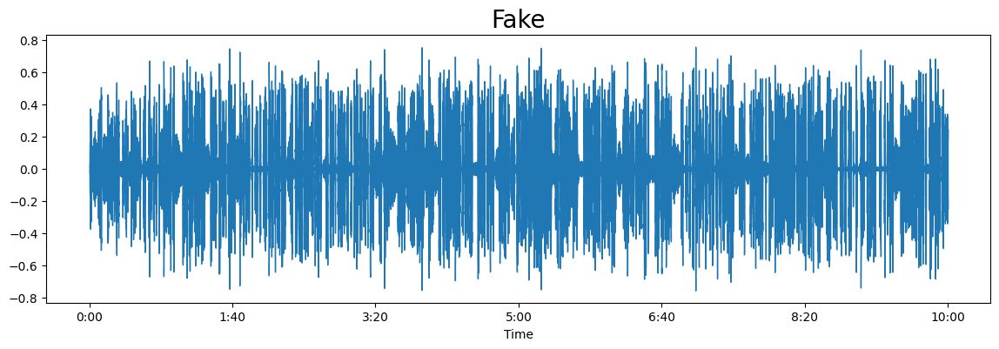

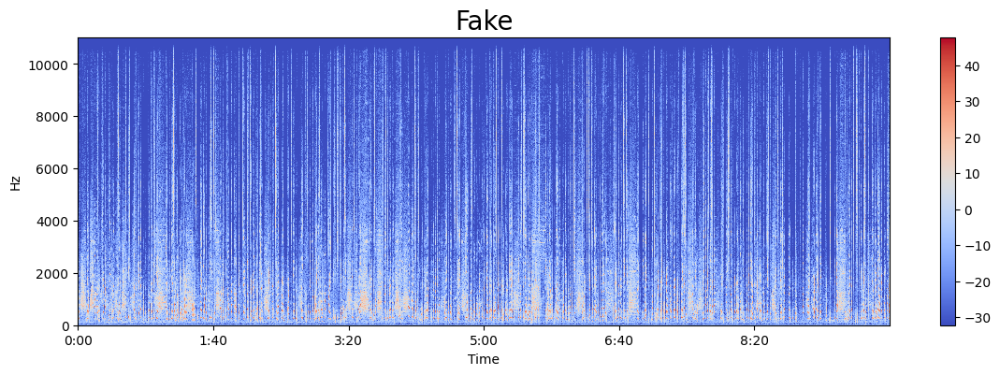

In [ ]:
path = "/content/KAGGLE/AUDIO/FAKE/biden-to-Obama.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Fake")
spectrogram(data,sampling_rate,"Fake")

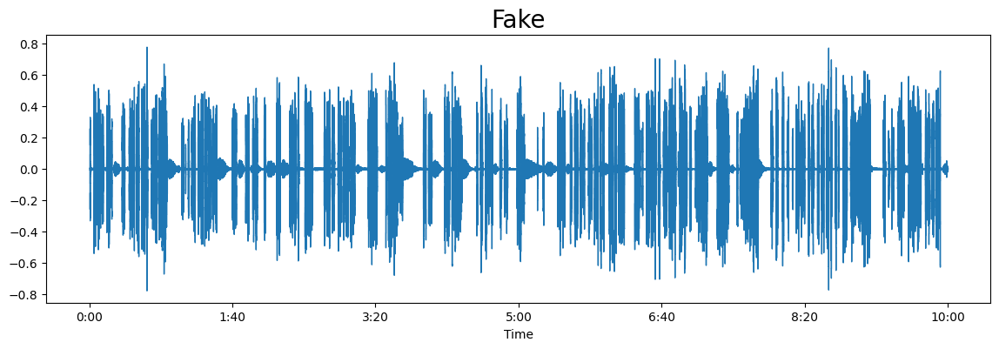

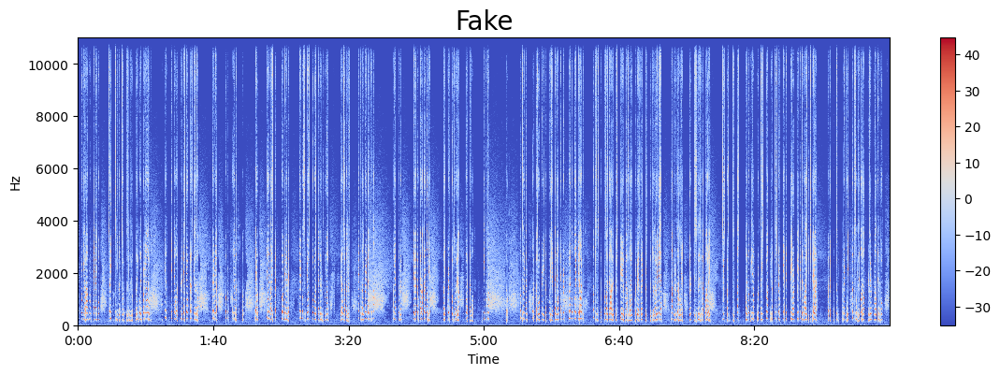

In [ ]:
path = "/content/KAGGLE/AUDIO/FAKE/Obama-to-Trump.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Fake")
spectrogram(data,sampling_rate,"Fake")

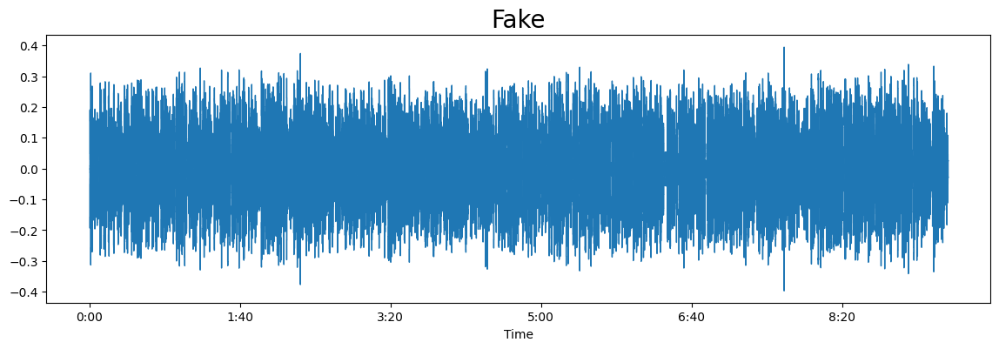

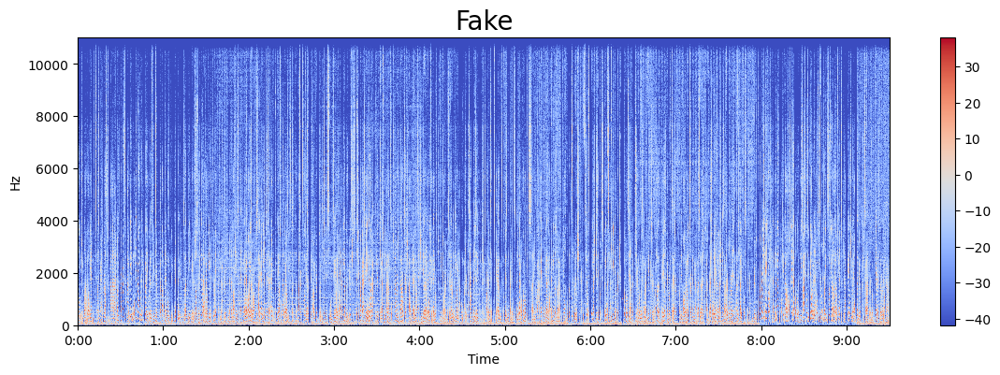

In [ ]:
path = "/content/KAGGLE/AUDIO/FAKE/linus-to-ryan.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Fake")
spectrogram(data,sampling_rate,"Fake")

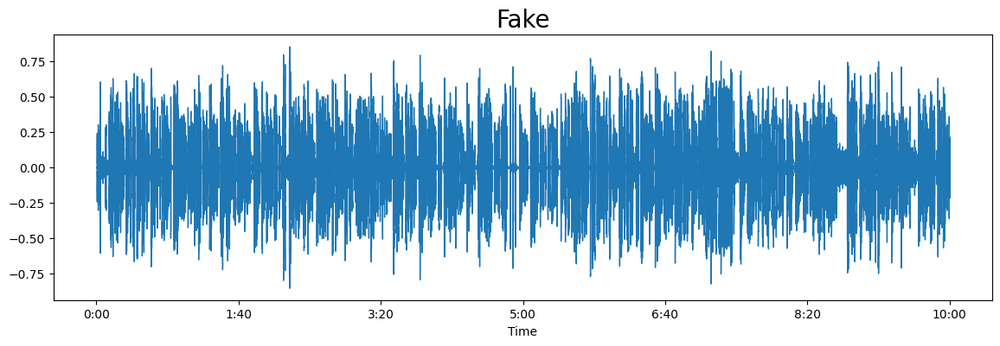

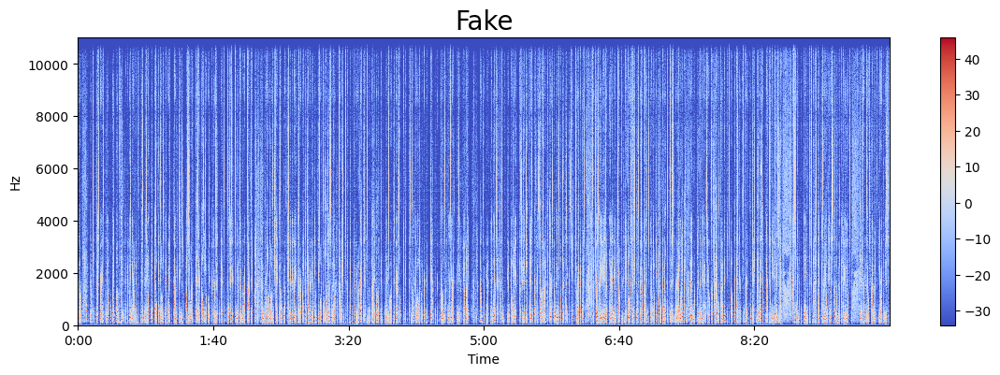

In [ ]:
path = "/content/KAGGLE/AUDIO/FAKE/taylor-to-biden.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Fake")
spectrogram(data,sampling_rate,"Fake")

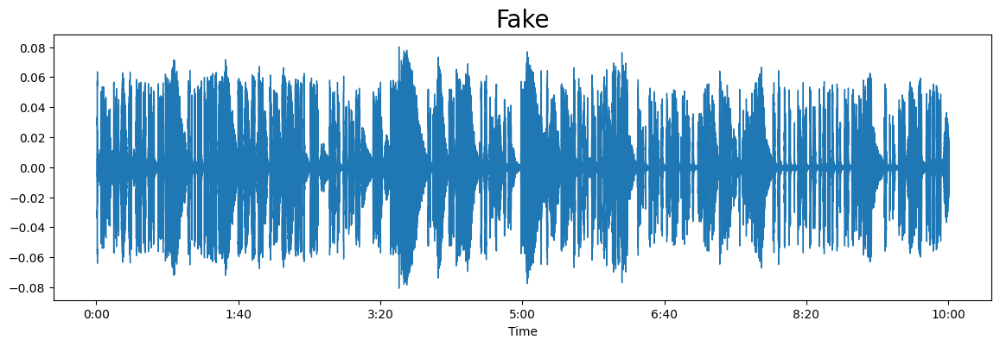

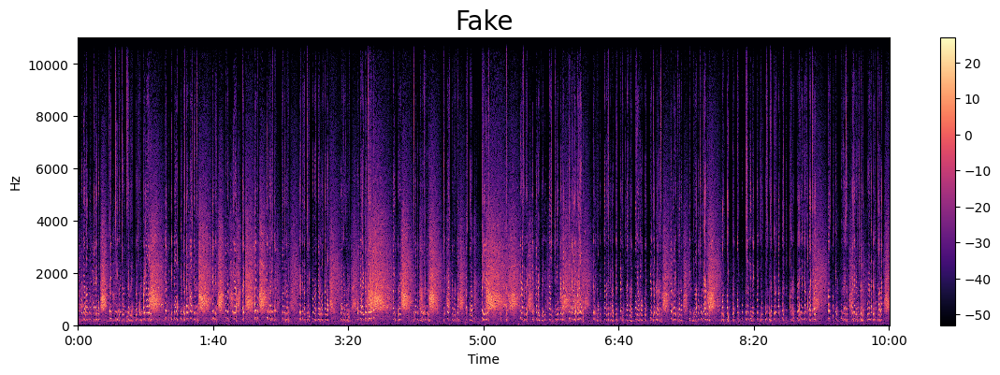

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/obama-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Fake")
spectrogram(data,sampling_rate,"Fake")

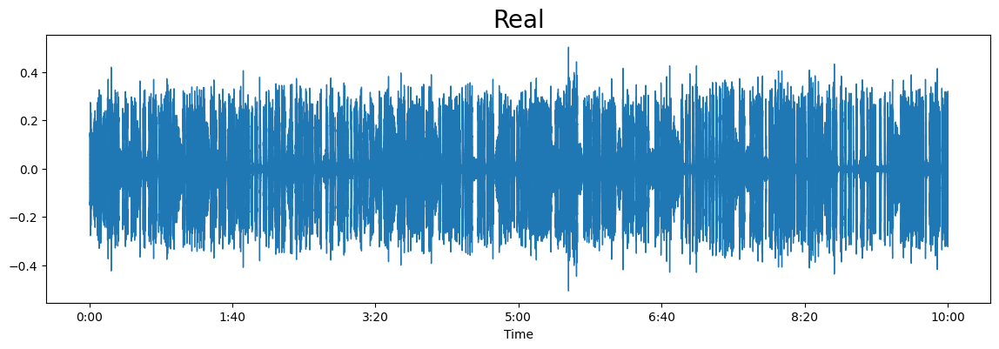

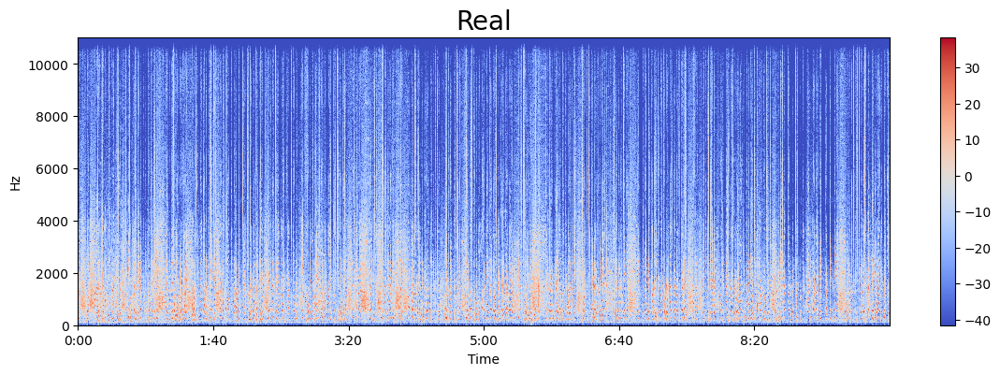

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/biden-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

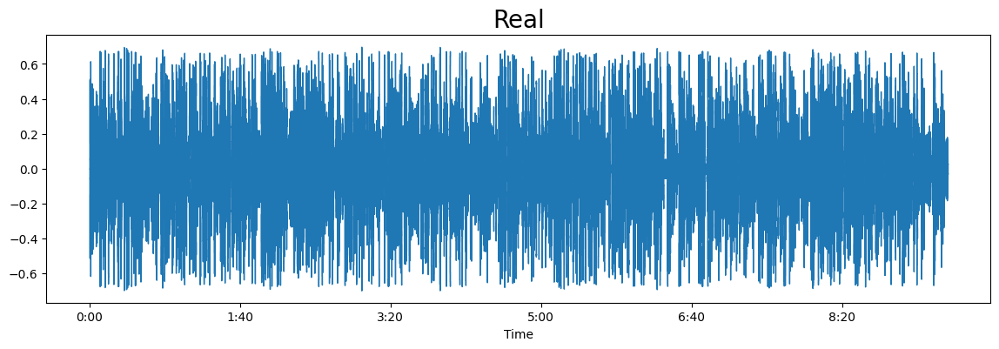

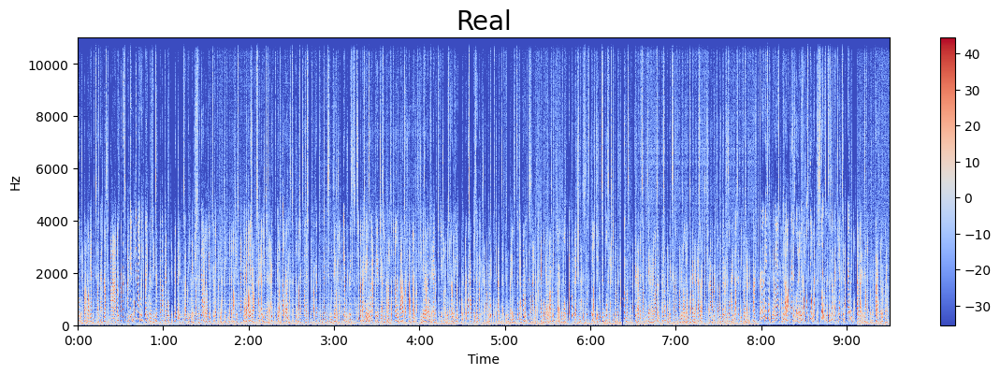

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/linus-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

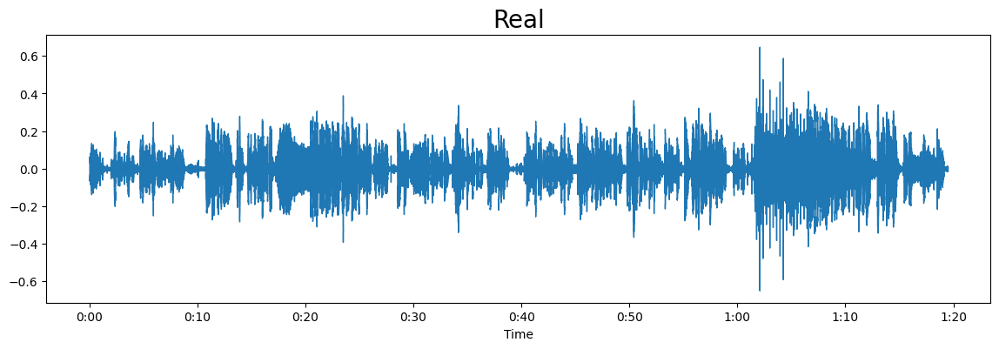

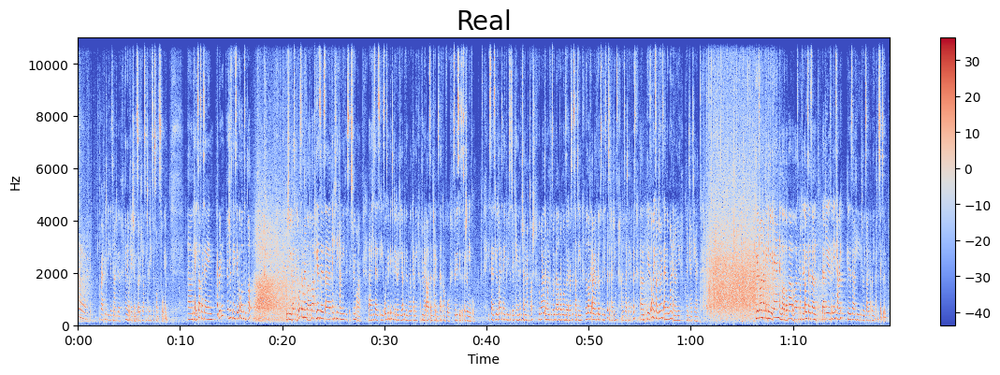

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/margot-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

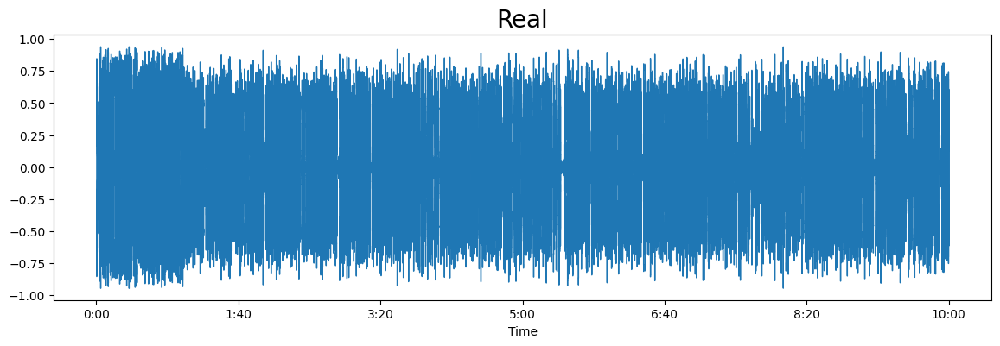

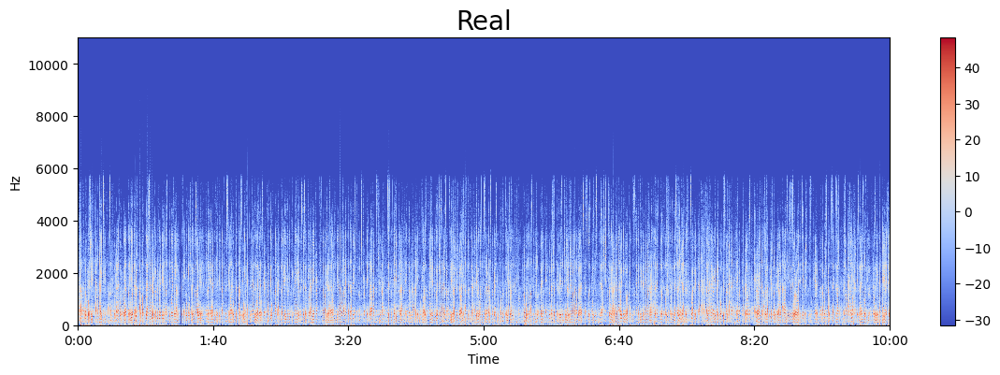

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/musk-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

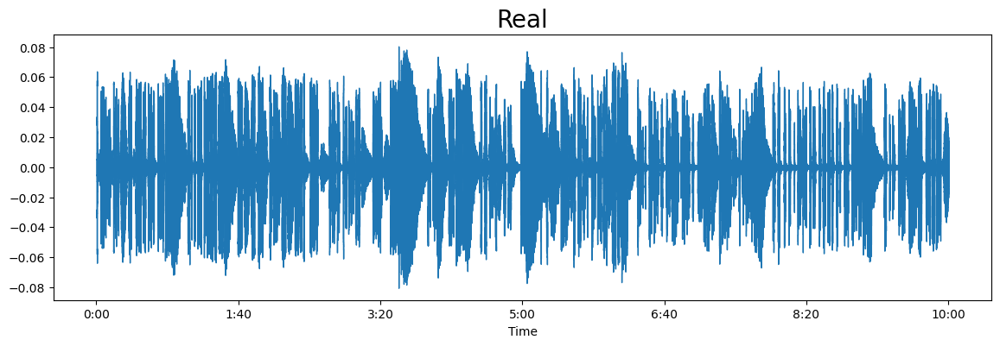

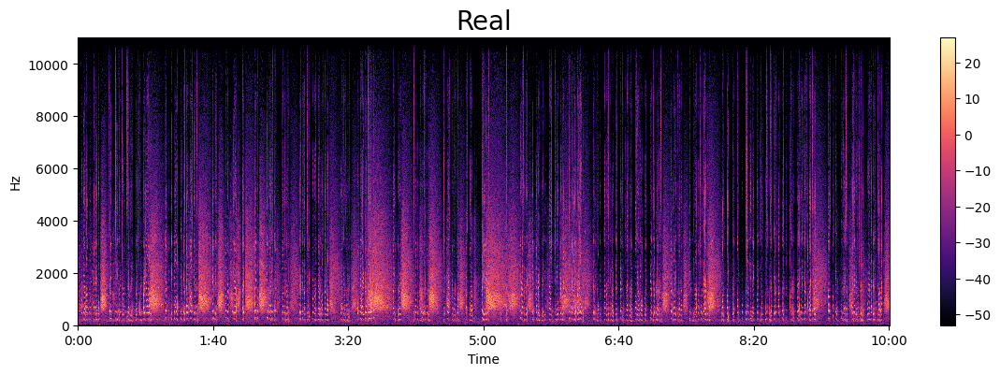

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/obama-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

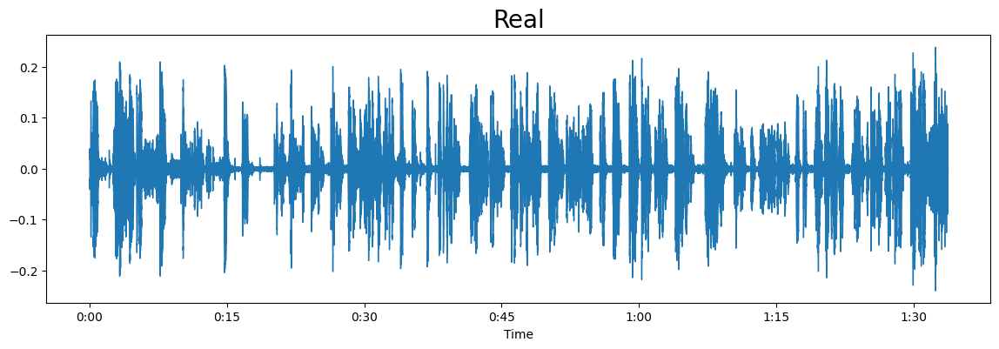

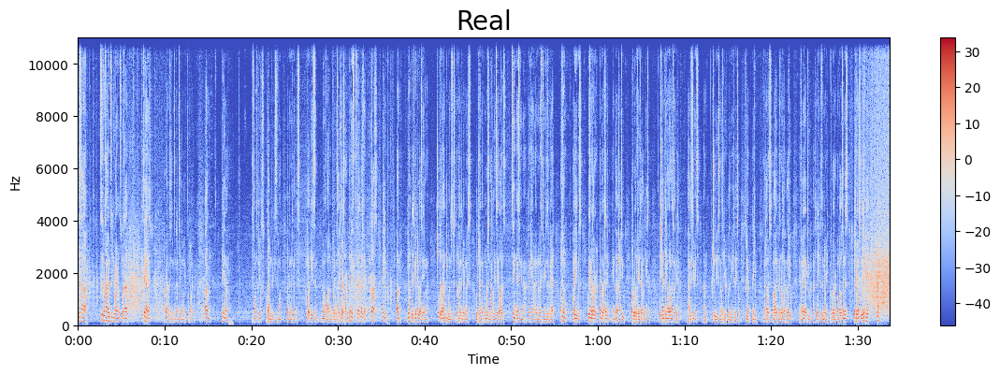

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/ryan-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

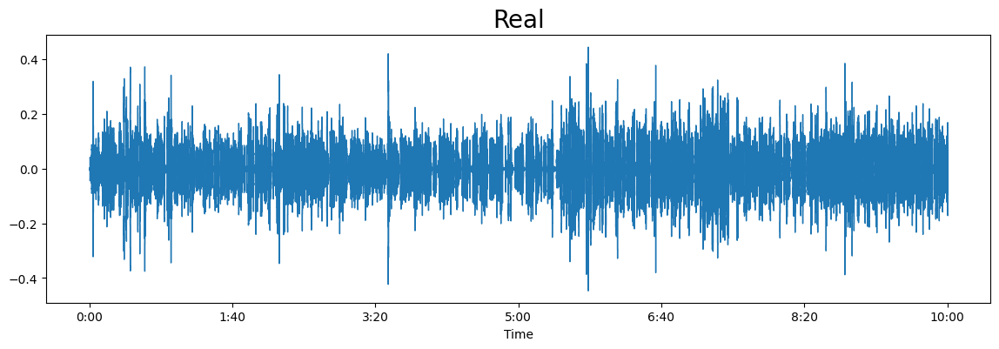

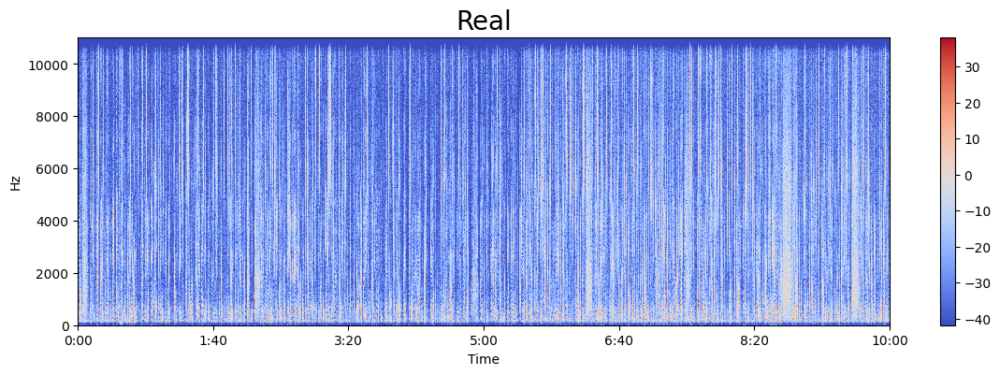

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/taylor-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

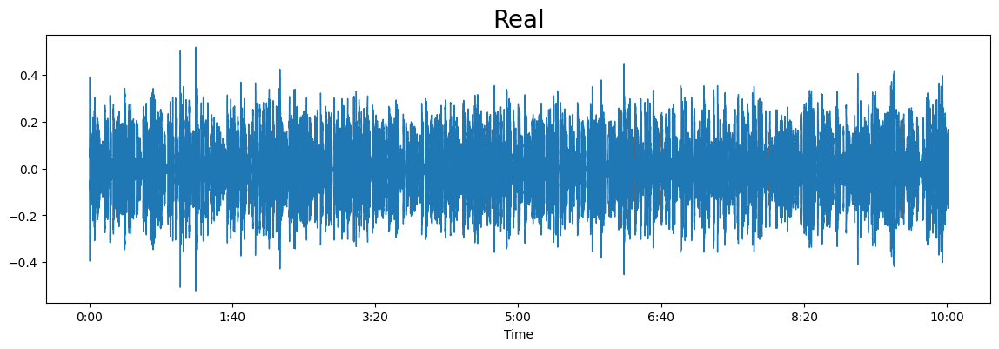

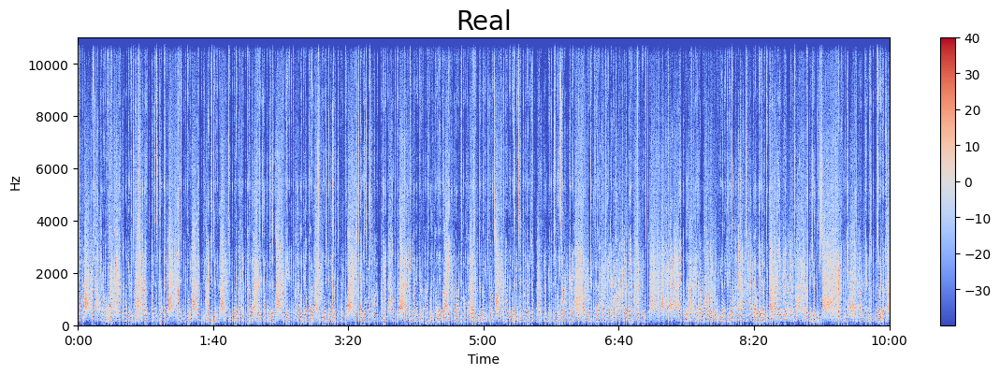

In [ ]:
path = "/content/KAGGLE/AUDIO/REAL/trump-original.wav"
data,sampling_rate = librosa.load(path)
waveplot(data,sampling_rate,"Real")
spectrogram(data,sampling_rate,"Real")

In [ ]:
df.head(2)

,audio,label
0,/content/KAGGLE/AUDIO/REAL/margot-original.wav,real
1,/content/KAGGLE/AUDIO/REAL/taylor-original.wav,real


# ***MEL FREQUENCY CEPSTRAL COEFFICENT***

# ***GENERATE THE FEATURE EXTRACTOR ACCORDING TO MFCC OF AUDIO***

In [ ]:
def feature_extractor(path):

  x,sr = librosa.load(path,duration=3,offset=0.5)

  x_mfcc = librosa.feature.mfcc(y=x,sr=sr,n_mfcc=40)

  x_mfcc = np.mean(x_mfcc.T,axis=0)

  return x_mfcc

# ***FEATURE EXTRACTOR OF WAVE AUDIO PATH***

In [ ]:
feature_extractor(df['audio'][0])

array([-3.3363522e+02,  9.2979721e+01, -1.9630459e+01,  2.1899267e+01,
       -4.8251190e+00, -7.4240246e+00, -1.8455368e+01, -4.3819108e+00,
       -9.7838182e+00, -3.0522507e-01, -1.0373845e+01, -1.7955836e+00,
       -1.2118217e+01, -4.9622788e+00, -8.6525450e+00, -6.9007945e+00,
       -1.0590196e+01, -3.1313846e+00, -1.0594895e+01, -5.3941164e+00,
       -7.2078524e+00, -6.6583776e+00, -7.3492899e+00, -6.2496543e+00,
       -7.9255342e+00, -2.1995919e+00, -6.1360545e+00,  4.6024576e-01,
       -2.4994969e+00,  2.1237555e+00, -3.4384530e+00,  1.1353415e+00,
       -1.8430678e+00,  5.3488884e+00,  2.8083251e+00,  6.7231760e+00,
        2.1875079e+00,  1.7125516e+00, -1.6083908e+00, -7.7477497e-01],
      dtype=float32)

# ***GENERATE THE MFCC FOR EACH AND EVERY AUDIO BY USING LAMBDA FUNCTION***

In [ ]:
X_mfcc = df['audio'].apply(lambda x: feature_extractor(x))

In [ ]:
X_mfcc

0     [-333.63522, 92.97972, -19.630459, 21.899267, ...
1     [-354.72934, 61.801598, -2.09509, 14.4577, -15...
2     [-303.40817, 53.594753, -17.748678, 8.957416, ...
3     [-214.50598, 193.6893, -41.348392, 19.670864, ...
4     [-322.88907, 86.33553, -27.941242, -15.656736,...
                            ...                        
59    [-414.24442, 72.04122, -0.31196433, 2.0451913,...
60    [-397.47693, 73.664795, -14.678083, 1.3772255,...
61    [-332.20554, 109.076836, -1.9433402, 16.226679...
62    [-226.18744, 89.272316, 15.709448, 20.095715, ...
63    [-418.5205, 87.81639, -4.7416263, 0.6486862, -...
Name: audio, Length: 64, dtype: object

In [ ]:
new_df = pd.read_csv("/content/KAGGLE/DATASET-balanced.csv")

In [ ]:
new_df.head(20)

,chroma_stft,rms,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,LABEL
0,0.338055,0.027948,2842.948867,4322.916759,6570.586186,0.041050,-462.169586,90.311272,19.073769,24.046888,...,-6.686564,0.902086,-7.251551,-1.198342,4.747403,-4.986279,0.953935,-5.013138,-6.779060,FAKE
1,0.443766,0.037838,2336.129597,3445.777044,3764.949874,0.047730,-409.413422,120.348808,-7.161531,5.114784,...,-2.131157,-6.876417,-1.359395,0.326401,-5.420016,-2.109968,-1.757634,-9.537907,-8.494421,FAKE
2,0.302528,0.056578,2692.988386,2861.133180,4716.610271,0.080342,-318.996033,120.490273,-24.625771,23.891073,...,-5.853725,-3.724773,-6.627182,-5.117002,-6.072106,-0.994653,-1.617120,-3.922354,-7.033001,FAKE
3,0.319933,0.031504,2241.665382,3503.766175,3798.641521,0.047180,-404.636749,136.320908,2.308172,-3.907071,...,-1.898315,-2.046493,-7.176277,-3.293508,4.209121,0.121835,-5.407063,-3.654926,-3.274857,FAKE
4,0.420055,0.016158,2526.069123,3102.659519,5025.077899,0.051905,-410.497925,152.731400,-18.266771,51.993462,...,-1.952340,0.810868,6.238493,6.555839,7.535542,2.849219,2.616843,-1.793357,-5.060998,FAKE
5,0.442880,0.012317,3952.880304,3702.717829,7104.089991,0.115387,-498.179657,97.245255,-21.382017,45.624386,...,-6.466366,2.856888,-0.157036,-2.824058,0.383832,-1.089466,2.998828,-5.218136,-1.423959,FAKE
6,0.453897,0.021782,4178.072150,3698.644769,7508.242075,0.131647,-410.383087,97.026733,-22.508402,49.689598,...,-5.320498,-4.209944,-2.051953,-0.714617,-7.889741,-0.377954,-8.421499,-5.800948,-12.060839,FAKE
7,0.474154,0.011107,3993.039753,3948.154333,7872.563956,0.114879,-440.818970,103.029533,-21.213911,49.066498,...,2.810230,-2.150585,-1.529685,3.354003,-6.589828,5.678379,-2.742477,-5.159016,-10.969421,FAKE
8,0.602690,0.000970,3815.431438,3992.517515,6887.564689,0.121769,-539.965088,94.811630,-51.388660,33.196476,...,-1.619109,10.417936,-9.675606,-0.937404,0.909395,4.827445,5.055848,-3.618021,5.053717,FAKE
9,0.453962,0.017612,2894.560788,3435.434131,5663.232422,0.065904,-403.053009,138.079620,-20.038134,39.301231,...,0.496345,-0.003924,0.801856,3.294856,-5.852333,-1.849402,-7.108891,-0.818681,-7.824217,FAKE


# ***GENERATE THE ANOTHER DATAFARME WITH MFCC FEATURE WITH AUDIO LABEL CLASSES***

In [ ]:
df1 = pd.DataFrame()
df1['feature'] = X_mfcc
df1['class'] = df['label']

# ***THE NEW DATAFRAME IS LOOK LIKE***

In [ ]:
df1.head(10)

,feature,class
0,"[-333.63522, 92.97972, -19.630459, 21.899267, ...",real
1,"[-354.72934, 61.801598, -2.09509, 14.4577, -15...",real
2,"[-303.40817, 53.594753, -17.748678, 8.957416, ...",real
3,"[-214.50598, 193.6893, -41.348392, 19.670864, ...",real
4,"[-322.88907, 86.33553, -27.941242, -15.656736,...",real
5,"[-234.82407, 113.75536, -78.49468, -17.712255,...",real
6,"[-237.5518, 131.6824, -3.4846692, 25.93914, 12...",real
7,"[-462.16107, 146.9784, -45.702248, 1.8329475, ...",real
8,"[-285.9402, 123.83618, -0.64689976, 11.912698,...",fake
9,"[-295.49435, 126.98589, -9.9992485, 34.843006,...",fake


# ***LOWER PART OF NEW DATAFRAME IS LOOK LIKE***

In [ ]:
new_df1.tail(10)

,feature,class
54,"[-311.51886, 111.113014, 4.0336137, 26.08133, ...",FAKE
55,"[-286.0662, 86.82813, -29.077093, -17.814064, ...",FAKE
56,"[-236.4406, 123.1948, -53.576496, -34.338455, ...",FAKE
57,"[-310.26822, 107.7782, -5.5784035, 24.215673, ...",FAKE
58,"[-381.42883, 71.83761, -12.9297285, -8.46203, ...",FAKE
59,"[-414.24442, 72.04122, -0.31196433, 2.0451913,...",FAKE
60,"[-397.47693, 73.664795, -14.678083, 1.3772255,...",FAKE
61,"[-332.20554, 109.076836, -1.9433402, 16.226679...",FAKE
62,"[-226.18744, 89.272316, 15.709448, 20.095715, ...",FAKE
63,"[-418.5205, 87.81639, -4.7416263, 0.6486862, -...",FAKE


# ***CONVERT THE FEATURE IN LIST FORMAT AND ASSIGN IN X AND CONVERT THE CLASSES IN LIST FORMAT AND ASSIGN IN Y***

In [ ]:
x = np.array(df1['feature'].tolist())
y = np.array(df1['class'].tolist())

# ***SHAPE OF X FEATURE***

In [ ]:
x.shape

(64, 40)

# ***X FEATURE LOOK LIKE***

In [ ]:
x

array([[-3.33635223e+02,  9.29797211e+01, -1.96304588e+01, ...,
         1.71255159e+00, -1.60839081e+00, -7.74774969e-01],
       [-3.54729340e+02,  6.18015976e+01, -2.09508991e+00, ...,
         4.76925993e+00,  6.14492536e-01,  2.50617671e+00],
       [-3.03408173e+02,  5.35947533e+01, -1.77486782e+01, ...,
         9.73564053e+00,  9.24840927e+00,  8.27419949e+00],
       ...,
       [-3.32205536e+02,  1.09076836e+02, -1.94334018e+00, ...,
        -1.62371135e+00, -2.83565974e+00,  1.07613695e+00],
       [-2.26187439e+02,  8.92723160e+01,  1.57094479e+01, ...,
         9.82073784e-01, -1.20862591e+00,  1.27417982e+00],
       [-4.18520508e+02,  8.78163910e+01, -4.74162626e+00, ...,
        -1.38901114e+00, -1.66397715e+00, -3.29596877e-01]], dtype=float32)

# ***Y SHAPE IS LOOK LIKE***

In [ ]:
y.shape

(64,)

#***CONVERT THE LABELS OF REAL AND FAKE IN 0 AND 1 BY USING DUMMIES FUNCTION OR ONE HOT ENCODING***

In [ ]:
y = np.array(pd.get_dummies(y))

# ***Y IS LOOK LIKE AFETR APPLY GET DUMMIES FUNCTION***

In [ ]:
y

array([[0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0]], dtype=uint8)

# ***DIVIDE THE X,Y IN USING TRAIN TEST SPLIT AND GENERATE THE X_TRAIN,X_TEST,Y_TRAIN,Y_TEST***

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=1)

# ***X_TRAIN IS AFTER APPLY TRAIN_TEST_SPLIT***

In [ ]:
x_train

array([[-2.36309891e+02,  1.07394394e+02, -5.22769890e+01, ...,
        -3.60949308e-01,  1.62503278e+00,  5.13945371e-02],
       [-3.10268219e+02,  1.07778198e+02, -5.57840347e+00, ...,
        -2.84327149e+00, -4.53692198e+00, -2.10191941e+00],
       [-3.11044647e+02,  1.11448975e+02, -5.98648453e+00, ...,
        -6.04960024e-01, -3.67736244e+00, -1.35124147e+00],
       ...,
       [-3.18555939e+02,  1.23599426e+02,  9.51046944e+00, ...,
         9.71058249e-01,  5.43636620e-01, -1.31936157e+00],
       [-2.83373077e+02,  8.34596100e+01, -2.30921154e+01, ...,
         3.17824244e+00,  2.08272886e+00,  2.30068302e+00],
       [-3.17497345e+02,  8.32976990e+01,  1.50938292e+01, ...,
        -1.53251767e+00, -2.21913123e+00,  9.22993720e-01]], dtype=float32)

# ***X_TRAIN SHAPE***

In [ ]:
x_train.shape

(51, 40)

# ***Y_TRAIN SHAPE***

In [ ]:
y_train.shape

(51, 2)

# ***X_TEST SHAPE***

In [ ]:
x_test.shape

(13, 40)

# ***Y_TEST SHAPE***

In [ ]:
y_test.shape

(13, 2)

# ***NUMBER OF LABEL IS***

In [ ]:
num_labels = y.shape[1]

In [ ]:
num_labels

2

# ***IMPORT DEEP LEARNING LIBRARY FOR CREATING MODEL IN SEQUNTIAL IMPORT DENSE,FLATTEN,ACTIVATIO,DROPOUT,ADAM OPTIMIZER AND METRICS***

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Flatten,Activation,Dropout
from tensorflow.keras.optimizers import Adam
from sklearn import metrics

# ***CREATING A CNN MODEL FOR OUR AUDIO DATASET***

In [ ]:
model = Sequential()

model.add(Dense(100,input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.1))


model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.1))


model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.1))


model.add(Dense(num_labels))
model.add(Activation('softmax'))



# ***SUMMARY OF MODEL***

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 100)               4100      
                                                                 
 activation_4 (Activation)   (None, 100)               0         
                                                                 
 dropout_3 (Dropout)         (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 200)               20200     
                                                                 
 activation_5 (Activation)   (None, 200)               0         
                                                                 
 dropout_4 (Dropout)         (None, 200)               0         
                                                                 
 dense_6 (Dense)             (None, 100)              

# ***COMPILATION OF MODEL***

In [ ]:
model.compile(loss="categorical_crossentropy",optimizer='adam',metrics=['accuracy'])

# ***TRAIN OUR MODEL WITH VALIDATION DATA***

In [ ]:
model.fit(x_train,y_train,batch_size=32,epochs=100,validation_data=(x_test,y_test))

Epoch 1/100
2/2 [==============================] - 1s 229ms/step - loss: 3.4675 - accuracy: 0.6863 - val_loss: 1.0171 - val_accuracy: 0.9231
Epoch 2/100
2/2 [==============================] - 0s 33ms/step - loss: 3.9543 - accuracy: 0.7647 - val_loss: 1.7942 - val_accuracy: 0.9231
Epoch 3/100
2/2 [==============================] - 0s 31ms/step - loss: 2.7632 - accuracy: 0.8235 - val_loss: 1.2289 - val_accuracy: 0.7692
Epoch 4/100
2/2 [==============================] - 0s 53ms/step - loss: 2.7909 - accuracy: 0.7255 - val_loss: 1.5497 - val_accuracy: 0.7692
Epoch 5/100
2/2 [==============================] - 0s 33ms/step - loss: 1.2215 - accuracy: 0.7647 - val_loss: 1.8237 - val_accuracy: 0.7692
Epoch 6/100
2/2 [==============================] - 0s 40ms/step - loss: 2.6829 - accuracy: 0.7059 - val_loss: 1.5066 - val_accuracy: 0.7692
Epoch 7/100
2/2 [==============================] - 0s 39ms/step - loss: 1.4714 - accuracy: 0.8431 - val_loss: 0.9508 - val_accuracy: 0.9231
Epoch 8/100
2/2 [==

# ***TESTING OUR FINAL MODEL BY SENDING WAVE AUDIO FILE AND PREDICT THE AUDIO IS REAL OR FAKE***

In [ ]:
filename="/content/KAGGLE/AUDIO/FAKE/taylor-to-musk.wav"
prediction_feature = feature_extractor(filename)
prediction_feature = prediction_feature.reshape(1,-1)
prediction=model.predict(prediction_feature)[0][0]
print(prediction)
print("Prediction of Voice")
if(prediction<=0.5):
  print("Real Voice Detected")
else:
  print("Fake Voice Detected")
#print(prediction)

1/1 [==============================] - 0s 33ms/step
0.96988904
Prediction of Voice
Fake Voice Detected
